# Le bruit de Worley

Dans cette partie nous allons nous intéresser à un **autre bruit** produisant des résultats **très différents du bruit de Perlin**. De plus son algorithme de génération est très simple. Ce chapitre va aussi nous permettre de reprendre ce qu'on a fait pour Perlin.

**Plan**
1. **Première approche** du bruit de **Worley**$\\[0 cm]$
    - Bruit de Worley en 2D$\\[0 cm]$
    - Bruit de Worley en 3D$\\[0 cm]$
2. **Optimisation** et **Applications** simples$\\[0 cm]$
    - Reécriture du code avec scipy$\\[0 cm]$
    - Approfondissement du bruit$\\[0 cm]$
    - Quelques applications$\\[0 cm]$
3. **Essaies** divers$\\[0 cm]$
    - Eau$\\[0 cm]$
    - Bruit Fractal$\\[0 cm]$
    - Domain Warping

## Première approche du bruit de Worley

Le **bruit de Worley** se construit en **générant un nombre de points à des coordonnées purement aléatoires** dans un espace d'une certaine taille. Ensuite il suffit pour chaque pixel de l'espace de **calculer la distance à chacun des points de l'espace et de garder la taille la plus proche** et de la mettre dans une matrice(tenseur si 3D) de la taille de l'espace(on pourra prendre la 2nd distance la plus proche pour avoir un résultat différent...).

### Bruit de Worley en 2D


Text(0.5, 1.0, 'n = 100, ordre 10')

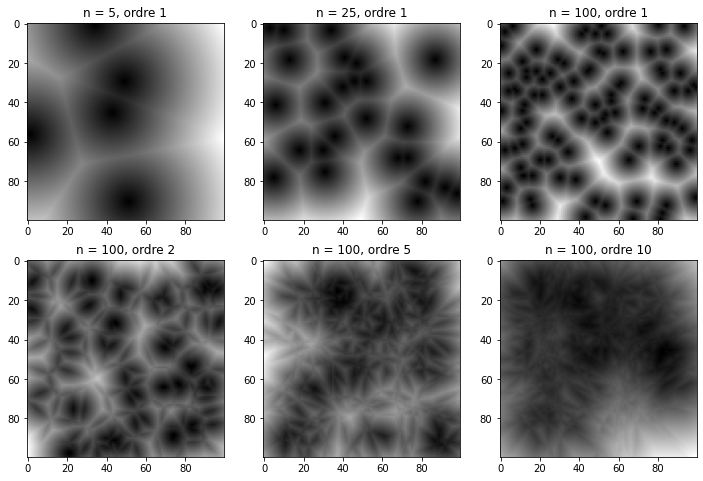

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt

#d = ordre / distance
def worley2d(shape,n,d=0):
    #n: Nombre de points placés aléatoirement dans l'espace
    if(d > n-1): 
        d = n-1
    
    points = [] #liste de tous les points
    for i in range (n): #Pour tous les points:
        x = np.random.randint(0,shape) #On créé une coordonnée x aléatoire
        y = np.random.randint(0,shape) #On créé une coordonnée y aléatoire
        coords = [x, y] # Coordonnées (x,y)
        points.append(coords) #Ajout des coordonées de chaque points dans la liste "points"
        
    M = np.zeros((shape,shape)) #On créé la matrice vide du bruit dans laquelle on va placer la distance la plus courte à chaque point
    
    for i in range (0, shape): #on parcourt tous les x
        for j in range (0, shape): #on parcourt tous les y
            #distance min
            dist_min = []
            for p in points:
                dist_min.append(np.sqrt((p[0]-i)**2 + (p[1]-j)**2))
            dist_min.sort()
            value_min = dist_min[d]
            M[i][j] = value_min
            
    return M

#Rendu matplotlib
fig, ax = plt.subplots(2,3,figsize=(12,8))
ax[0][0].imshow(worley2d(100,5,0), cmap="gray")
ax[0][0].set_title("n = 5, ordre 1")
ax[0][1].imshow(worley2d(100,25,0), cmap="gray")
ax[0][1].set_title("n = 25, ordre 1")
ax[0][2].imshow(worley2d(100,100,0), cmap="gray")
ax[0][2].set_title("n = 100, ordre 1")
ax[1][0].imshow(worley2d(100,100,1), cmap="gray")
ax[1][0].set_title("n = 100, ordre 2")
ax[1][1].imshow(worley2d(100,100,4), cmap="gray")
ax[1][1].set_title("n = 100, ordre 5")
ax[1][2].imshow(worley2d(100,100,9), cmap="gray")
ax[1][2].set_title("n = 100, ordre 10")


En premier lieu on observe un effet de "**cristallisation**" quand on prend une distance qui n'est pas la plus proche. Cette effet pourrait être utile pour un artiste. Ensuite pour l'ordre 1 donc la distance minimale, on a quelque chose ressemblant à des cellules d'où un nom très commun donné au bruit de Worley : Le **bruit cellulaire** / "Cellular Noise"

Et en effet la programmation de ce **bruit est rapide et efficace**(c'est à dire la seule chose pouvant être optimisée est le calcul des distances que l'on fera plus tard).

Passons maintenant en 3D pour faire quelques animations et voir comment ça évolue.

### Bruit de Worley en 3D

Le principe est le même, il suffit de générer une **coordonnée supplémentaire et de calculer la distance sur un axe en plus**.

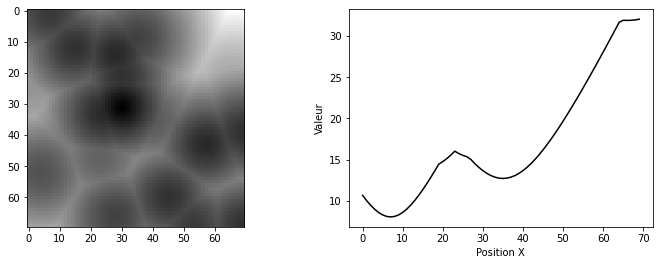

In [3]:
#d = ordre / distance
def worley3d(shape,n,d=0):
    #n: Nombre de points placés aléatoirement dans l'espace
    if(d > n-1): 
        d = n-1
    
    points = [] #liste de tous les points
    for i in range (n): #Pour tous les points:
        x = np.random.randint(0,shape) #On créé une coordonnée x aléatoire
        y = np.random.randint(0,shape) #On créé une coordonnée y aléatoire
        z = np.random.randint(0,shape) #On créé une coordonnée z aléatoire
        coords = [x, y, z] # Coordonnées (x,y)
        points.append(coords) #Ajout des coordonées de chaque points dans la liste "points"
        
    M = np.zeros((shape,shape,shape)) #On créé la matrice vide du bruit dans laquelle on va placer la distance la plus courte à chaque point
    
    for i in range (0, shape): #on parcourt tous les x
        for j in range (0, shape): #on parcourt tous les y
            for k in range (0, shape): #on parcourt tous les z
                #distance min
                dist_min = []
                for p in points:
                    dist_min.append(np.sqrt((p[0]-i)**2 + (p[1]-j)**2 + (p[2]-k)**2))
                dist_min.sort()
                value_min = dist_min[d]
                M[i][j][k] = value_min    
    return M
            
from matplotlib import animation, rc
import matplotlib.cm as cm
rc('animation', html='jshtml')

M = worley3d(70, 100, 0)

#Rendu
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].imshow(M[0], cmap='gray')
ax[1].plot(M[0][0], color="black")
plt.xlabel("Position X")
plt.ylabel("Valeur")
plt.show()

fig1 = plt.figure()
l = plt.imshow(M[0], cmap="gray", interpolation='quadric', animated=True)
plt.colorbar()
plt.close()
animation.FuncAnimation(fig1, lambda p: l.set_data(M[p]), frames=70, interval=100)

Maintenant à l'**ordre 10**:

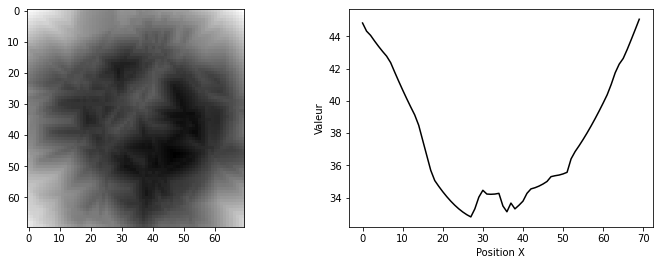

In [4]:
M = worley3d(70, 100, 9)

fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].imshow(M[0], cmap='gray')
ax[1].plot(M[0][0], color="black")
plt.xlabel("Position X")
plt.ylabel("Valeur")
plt.show()

fig1 = plt.figure()
l = plt.imshow(M[0], cmap="gray", interpolation='quadric', animated=True)
plt.colorbar()
plt.close()
animation.FuncAnimation(fig1, lambda p: l.set_data(M[p]), frames=70, interval=100)

## Optimisation et Applications simples

### Reécriture du code avec scipy

Un **moyen d'optimiser le calcul des distances** est d'**organiser les points** non en tableau mais **en arbre**. C'est à dire que les points les proches seront sur une branche et les plus éloignés sur une autre. Donc pour chaque pixel on calcule la distance aux points sur notre branche. On va aussi en profiter pour organiser le bruit 3D dans un objet.

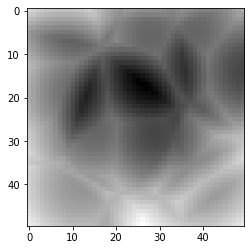

In [1]:
import numpy as np
import scipy.spatial as sp
import matplotlib.pyplot as plt
import random
import math
from matplotlib import animation, rc
import matplotlib.cm as cm
rc('animation', html='jshtml')

#Méthode 1 via scripy et numpy
def worley2D(res, density, n=0):
    
    points = [[np.random.randint(0, res), np.random.randint(0, res)] for _ in range(density)]
    
    #Les coo qu'on aura besoin
    coord = np.dstack(np.mgrid[0:res, 0:res])
    #Création de l'arbre avec scipy
    tree = sp.cKDTree(points)
    #On calcule la distance avec la méthode associée à l'arbre
    dist = tree.query(coord, workers=-1)[n]
    
    #Normalise le bruit
    return dist / dist.max()

#Méthode 2 sans rien
class Worley3D:     
    #Constructeur de l'objet
    def __init__(self, res, density, n_dis=0):    
        self.res =res
        self.density = density
        #On génère les points
        self.generatePoints()
        #On calcule le bruit
        self.calculateNoise(n_dis)
    def generatePoints(self):
        self.points = [(random.randint(0, self.res), random.randint(0, self.res), random.randint(0, self.res)) for x in range(self.density)]
    def calculateNoise(self, n_dist):
        self.data = [[[sorted([math.sqrt((p[0]-x)**2 + (p[1]-y)**2 + (p[2]-z)**2) for p in self.points])
                      [n_dist] for x in range(self.res)] for y in range(self.res)]for z in range(self.res)]
        self.data = np.array(self.data)
        self.data = self.data / self.data.max()
    #Si on veut afficher le bruit 2D ou 3D
    def show2DNoise(self, index=0):
        fig, ax = plt.subplots(figsize=(12,4))
        ax.imshow(self.data[index], cmap='gray')
        plt.show()
    def show3DNoise(self, frames=40, interval=100):
        fig1 = plt.figure()
        l = plt.imshow(self.data[0], cmap="gray", interpolation='quadric', animated=True)
        plt.colorbar()
        animation.FuncAnimation(fig1, lambda p: l.set_data(self.data[p]), frames=frames, interval=interval)

noise = Worley3D(50,50,1)
noise.show2DNoise()


### Approfondissement du bruit

Avec la méthode de l'arbre on peut aussi afficher ce qu'on appelle un : **Diagrame de Voronoi**(pavage cellulaire):

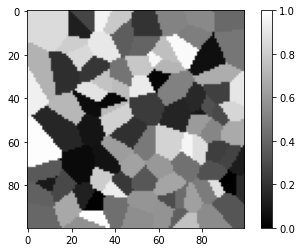

In [6]:
plt.imshow(worley2D(100,100,1), cmap="gray")
plt.colorbar()

### Quelques applications

Essayons d'appliquer la méthode du "**Ridge**"(Défini lors de la manipulation du bruit de Perlin) pour le bruit de Worley et de voir ce que ça donne:

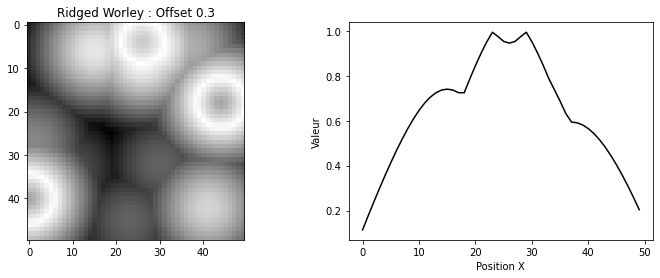

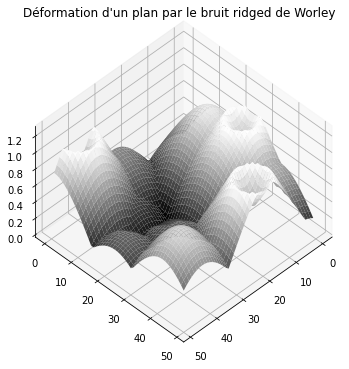

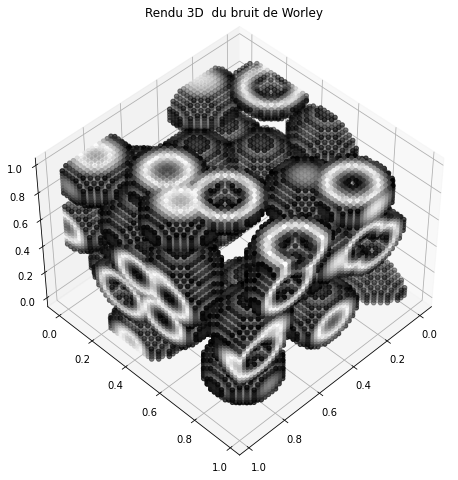

In [16]:
shape = 50
#On calcule le bruit
M = Worley3D(shape,shape,0).data

#On  calcule le ridge et on le normalise
M_ridge = (-1 * np.abs(M-0.3)+1) #M2 matrice normalisée et application du ridge en passant par la valeur absolue (pour obtenir des spheres), même principe que le schema du sinus 
M_ridge = M_ridge - M_ridge.min()
M_ridge = M_ridge / M_ridge.max()

#Rendu du bruit en 2D et 1D
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].set_title("Ridged Worley : Offset 0.3")
ax[0].imshow(M_ridge[0], cmap='gray')
ax[1].plot(M_ridge[0][0], color="black")
plt.xlabel("Position X")
plt.ylabel("Valeur")
plt.show()

#Rendu d'une déformation d'un plan par le bruit
X,Y = np.mgrid[0:shape,0:shape] #on créé une grille  
fig = plt.figure(figsize = (6,6))
ax = plt.axes(projection ='3d')
ax.set_title("Déformation d'un plan par le bruit ridged de Worley")
ax.set_proj_type('ortho')
ax.view_init(45, 45)
ax.set_zlim3d(0,1.3)
ax.plot_surface(X, Y, M_ridge[0], cmap="gray",linewidth=2, antialiased=True)

#Fonction déjà décrite dans le chapitre sur le bruit de Perlin : Permet de réarranger nos paramètres pour qu'ils soient compatibles avec la fonction de matplotlib
def rearrange_list(pic, val, infe):
    X = []
    Y = []
    Z = []
    values = []
    for k in range(len(pic)):
        for j in range(len(pic[k])):
            for i in range (len(pic[k][j])):
                value = pic[k][j][i]
                if((infe and (value < val)) or (not(infe) and (value > val))):
                    values.append(value)
                    X.append(i / len(pic[k][j]))
                    Y.append(j / len(pic[k]))
                    Z.append(k / len(pic))
    return (X,Y,Z,values)

#Rendu 3D du bruit en enlevant les valeurs les plus hautes (pour obtenir des sphères)
X,Y,Z,values = rearrange_list(M_ridge,0.8,False)#1-0,8=0.2 est le rayon des sphères
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(45, 45)
ax.scatter3D(X, Y, Z, c=values, cmap='gray')
ax.set_title("Rendu 3D  du bruit de Worley")
plt.show() #On remarque que les points sont au centre des sphères

## Essaies diverses

### Eau

Réaliser une première itération d'un shader d'eau peut se faire en une étape avec le bruit de Worley. Evidemment les artistes travaillent bien plus cet effet en lui rajoutant beaucoup de choses. Pour réaliser de l'eau on va rendre la déformation d'un plan avec le bruit de worley et l'animer avec un axe temps + une translation sur un axe.

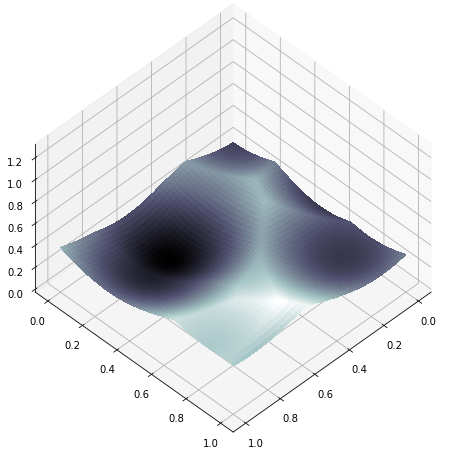

In [41]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt

#On, a besoin de bouger dans le bruit donc shape > taille qu'on va rendre
shape = 220
pic_worley = Worley3D(shape,50).data
 
def f(x, y, i):
    #On rend une taille de 100x100 dans un espace de 500x500
    return np.zeros([100,100]) + pic_worley[i][0:100,i:100+i]

#Rendu 3D
x = np.linspace(0, 1, 100)
y = np.linspace(0, 1, 100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y, 0)

fig = plt.figure(figsize = (8,8))
ax = plt.axes(projection ='3d')
ax.set_proj_type('ortho')
ax.view_init(45, 45)
ax.set_zlim3d(0,1.3)
ax.plot_surface(X, Y, Z, cmap="bone",linewidth=2, antialiased=True)


def update(p):
    ax.clear()
    ax.set_zlim3d(0,1.3)
    ax.plot_surface(X, Y, f(X,Y,p), cmap="bone",linewidth=0, antialiased=False)

animation.FuncAnimation(fig, update, frames=100, interval=50)

### Bruit Fractal

Essayons maintenant de faire la **somme** de plusieurs bruits de **Worley** à **différentes fréquences**(= nombre de points) et différentes amplitudes. (= **Fractal**, la méthode qu'on avait appliqué pour le bruit de Perlin).

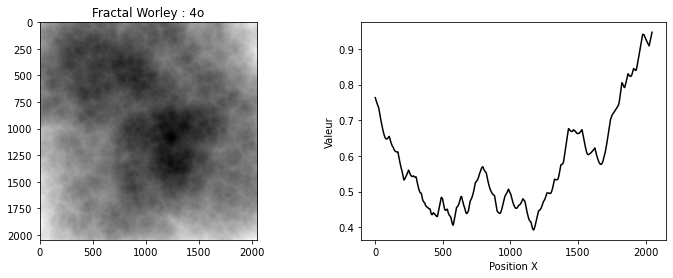

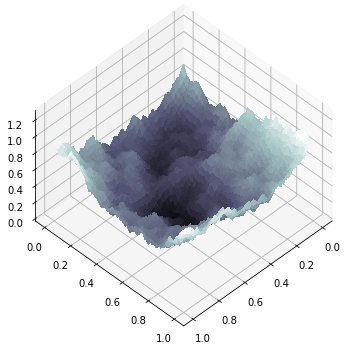

In [39]:
def fractal2D(shape, density, voronoi=0, octaves=1, persistance=0.5, exponentiation=1, lacunarity=1, norm=True, noise = []):
    #Si jamais on n'a pas mis de bruit en argument de la fonction, on crée une matrice
    if(len(noise) == 0):
        noise = np.zeros([shape,shape])
    frequency = 1
    amplitude = 1
    #Tous les paramètres sont expliqués plus bas
    for _ in range(octaves):
        noise += amplitude * worley2D(shape, density*frequency, voronoi)
        frequency *= lacunarity
        amplitude *= persistance
    noise = noise**exponentiation 
    #On normalise le bruit
    return noise/noise.max() if(norm) else noise

shape = 2**11

M = fractal2D(shape,3,0,4,0.5,1,10) 

fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].set_title("Fractal Worley : 4o")
ax[0].imshow(M, cmap='gray')
ax[1].plot(M[0], color="black")
plt.xlabel("Position X")
plt.ylabel("Valeur")
plt.show()

#Rendu 3D
x = np.linspace(0, 1, shape)
y = np.linspace(0, 1, shape)
X, Y = np.meshgrid(x, y)

fig = plt.figure(figsize = (6,6))
ax = plt.axes(projection ='3d')
ax.set_proj_type('ortho')
ax.view_init(45, 45)
ax.set_zlim3d(0,1.3)
ax.plot_surface(X, Y, M, cmap="bone",linewidth=0, antialiased=False)

On pourrait utiliser la version fractale comme **base de nuage** par exemple. On remarque cependant que c'est vite limité si on veut l'appliquer pour générer un terrain. En effet on **remarque très bien des formes de cercles/demi-sphères** dans la déformation.
Néanmoins son aspect est **très différent** de celui de **Perlin** donc le bruit de Worley permet de **combler certaines lacunes** du bruit de Perlin/ de faire des choses plus facilement. Beaucoup d'artistes utilisent d'ailleurs le bruit de Worley pour mettre en évidence le contour d'un objet 3D à l'aide de quelques opérations supplémentaires.

### Domain Warping
Lors du dernier chapitre, nous avons vu un outil très utile qui est la **déformation spatiale du bruit par un autre bruit**. On va essayer de l'appliquer sur le bruit de Worley. On va combiner les cas possibles si on déforme un bruit de Perlin par un bruit de Worley ou l'inverse et ça avec et sans dépendance en x et y.

SANS DEPENDANCE EN X ET Y


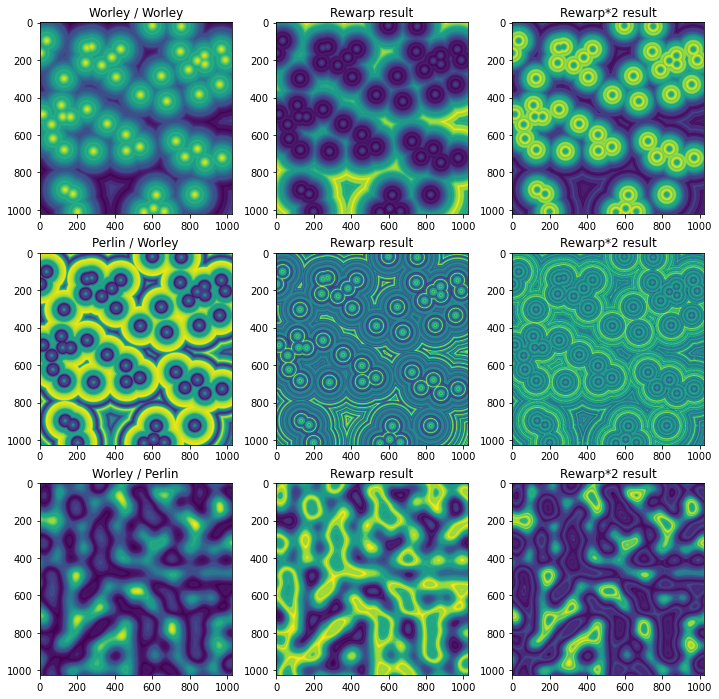

AVEC WARP DEPENDANT DE X ET Y


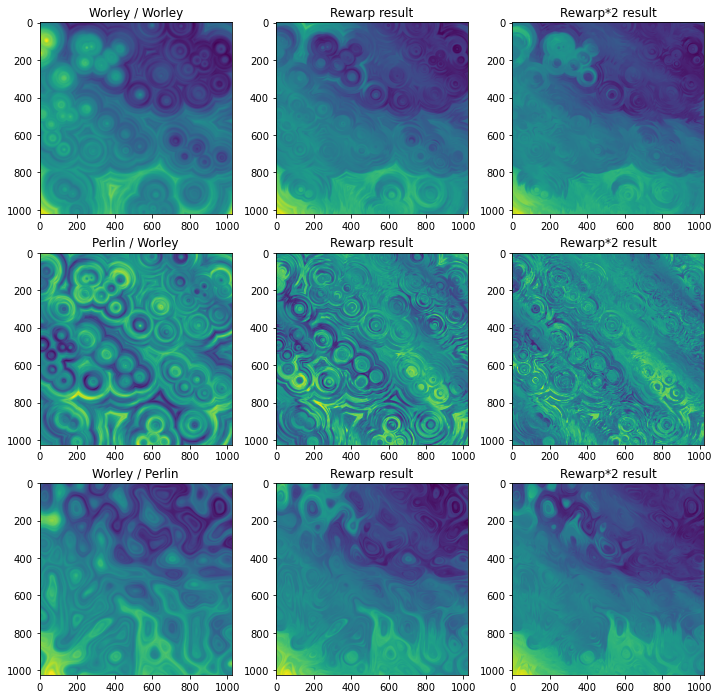

In [49]:
import perlin2D as perlin

#Rappel de la fonction warp : 
#fundamental : n_1
# "transf" : Bruit qui va nous servir pour la transformation = n_2
# vec : Coefficients pour avoir notre +r dans g(r)
def warp(fundamental, transf, vec = (0,0)):
    #On initialise notre variable que l'on va renvoyer à la fin
    result = np.zeros([shape,shape])
    
    #On normalise le bruit que l'on transforme si jamais il ne l'était pas
    transf = transf - transf.min()
    transf = transf / transf.max() -0.000001
    transf = np.floor(transf * shape)
    
    
    #On applique l'opération que l'on souhaite pour tous les pixels de l'espace.
    for x in range(shape):
        for y in range(shape):
            #Ici on reconnait bien la forme f(n(x,y) + x + y):
            result[x][y] = fundamental[int(transf[x][y]) + x * vec[1]][int(transf[x][y]) + y *vec[1]]
    
    #On normalise le bruit obtenu
    result = result - result.min()
    result = result / result.max()
    return result

fundamental_worley = fractal2D(2**11,3,0,4,0.5,1,10) 
fundamental_perlin = perlin.Perlin2D([2**11,2**11],[2**3,2**3]).fractal2D(3, 0.5, 1, 2)

#Notre taille finale
shape = 2**10

print("SANS DEPENDANCE EN X ET Y")

#Calcul
transf_worley = worley2D(shape,50,0)
transf_perlin = perlin.Perlin2D([shape,shape],[2**3,2**3]).noise

worley_worley = warp(fundamental_worley,transf_worley)
perlin_worley = warp(fundamental_perlin,transf_worley)
worley_perlin = warp(fundamental_worley,transf_perlin)

worley_worley2 = warp(fundamental_worley,worley_worley)
perlin_worley2 = warp(fundamental_perlin,perlin_worley)
worley_perlin2 = warp(fundamental_worley,worley_perlin)

worley_worley3 = warp(fundamental_worley,worley_worley2)
perlin_worley3 = warp(fundamental_perlin,perlin_worley2)
worley_perlin3 = warp(fundamental_worley,worley_perlin2)

#Rendu
fig, ax = plt.subplots(3,3, figsize=(12,12))
ax[0][0].imshow(worley_worley)
ax[0][0].set_title("Worley / Worley")
ax[0][1].imshow(worley_worley2)
ax[0][1].set_title("Rewarp result")
ax[0][2].imshow(worley_worley3)
ax[0][2].set_title("Rewarp*2 result")

ax[1][0].imshow(perlin_worley)
ax[1][0].set_title("Perlin / Worley")
ax[1][1].imshow(perlin_worley2)
ax[1][1].set_title("Rewarp result")
ax[1][2].imshow(perlin_worley3)
ax[1][2].set_title("Rewarp*2 result")

ax[2][0].imshow(worley_perlin)
ax[2][0].set_title("Worley / Perlin")
ax[2][1].imshow(worley_perlin2)
ax[2][1].set_title("Rewarp result")
ax[2][2].imshow(worley_perlin3)
ax[2][2].set_title("Rewarp*2 result")
plt.show()

print("AVEC WARP DEPENDANT DE X ET Y")
#Calcul
worley_worley = warp(fundamental_worley,transf_worley, (1,1))
perlin_worley = warp(fundamental_perlin,transf_worley, (1,1))
worley_perlin = warp(fundamental_worley,transf_perlin, (1,1))

worley_worley2 = warp(fundamental_worley,worley_worley, (1,1))
perlin_worley2 = warp(fundamental_perlin,perlin_worley, (1,1))
worley_perlin2 = warp(fundamental_worley,worley_perlin, (1,1))

worley_worley3 = warp(fundamental_worley,worley_worley2, (1,1))
perlin_worley3 = warp(fundamental_perlin,perlin_worley2, (1,1))
worley_perlin3 = warp(fundamental_worley,worley_perlin2, (1,1))

#Rendu
fig, ax = plt.subplots(3,3, figsize=(12,12))
ax[0][0].imshow(worley_worley)
ax[0][0].set_title("Worley / Worley")
ax[0][1].imshow(worley_worley2)
ax[0][1].set_title("Rewarp result")
ax[0][2].imshow(worley_worley3)
ax[0][2].set_title("Rewarp*2 result")

ax[1][0].imshow(perlin_worley)
ax[1][0].set_title("Perlin / Worley")
ax[1][1].imshow(perlin_worley2)
ax[1][1].set_title("Rewarp result")
ax[1][2].imshow(perlin_worley3)
ax[1][2].set_title("Rewarp*2 result")

ax[2][0].imshow(worley_perlin)
ax[2][0].set_title("Worley / Perlin")
ax[2][1].imshow(worley_perlin2)
ax[2][1].set_title("Rewarp result")
ax[2][2].imshow(worley_perlin3)
ax[2][2].set_title("Rewarp*2 result")
plt.show()


**On en conclut que le bruit de Worley étant très différent du bruit de Perlin il permet de nous constituer une base supplémentaire pour la formation d'effets.**